In [1]:
import torch
import torchvision
print('Pytorch version:', torch.__version__)
print('Trorchvision version', torchvision.__version__)
print('CUDA IS available', torch.cuda.is_available())

Pytorch version: 2.0.1+cu117
Trorchvision version 0.15.2+cu117
CUDA IS available True


In [3]:
# import sys

In [12]:
# !{sys.executable} -m pip install opencv-python matplotlib

In [13]:
# !{sys.executable} -m pip install 'git+https://<@github.com/facebookresearch/segment-anything.git'


In [14]:
# !mkdir images
# !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

# !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import io
from PIL import Image
# from google.colab import files

In [3]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    polygons = []
    color = []
    for ann in sorted_anns:
        m = ann['segmentation']
        img = np.ones((m.shape[0], m.shape[1],3))
        color_mask = np.random.random((1,3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.35)))

## 이미지 업로드

In [4]:
# 로컬 파일 경로를 사용하여 이미지를 읽어옵니다.
image_path = "images/person.jpg"
image = np.array(Image.open(image_path))

# image = io.BytesIO(image_file[list(image_file.keys())[0]])
# image = np.array(Image.open(image))

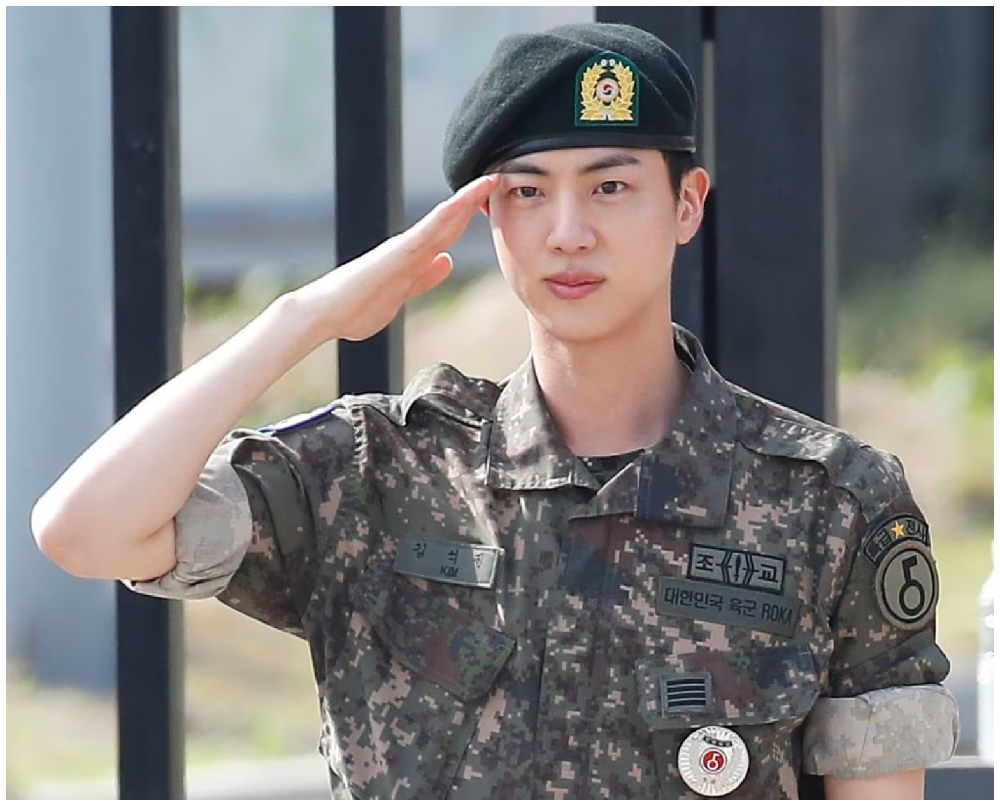

In [5]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

# 자동 마스크 생성

In [6]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = 'sam_vit_h_4b8939.pth'
model_type = 'vit_h'

device = 'cuda'

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

In [7]:
masks = mask_generator.generate(image)

In [8]:
print(len(masks))
print(masks[0].keys())

74
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


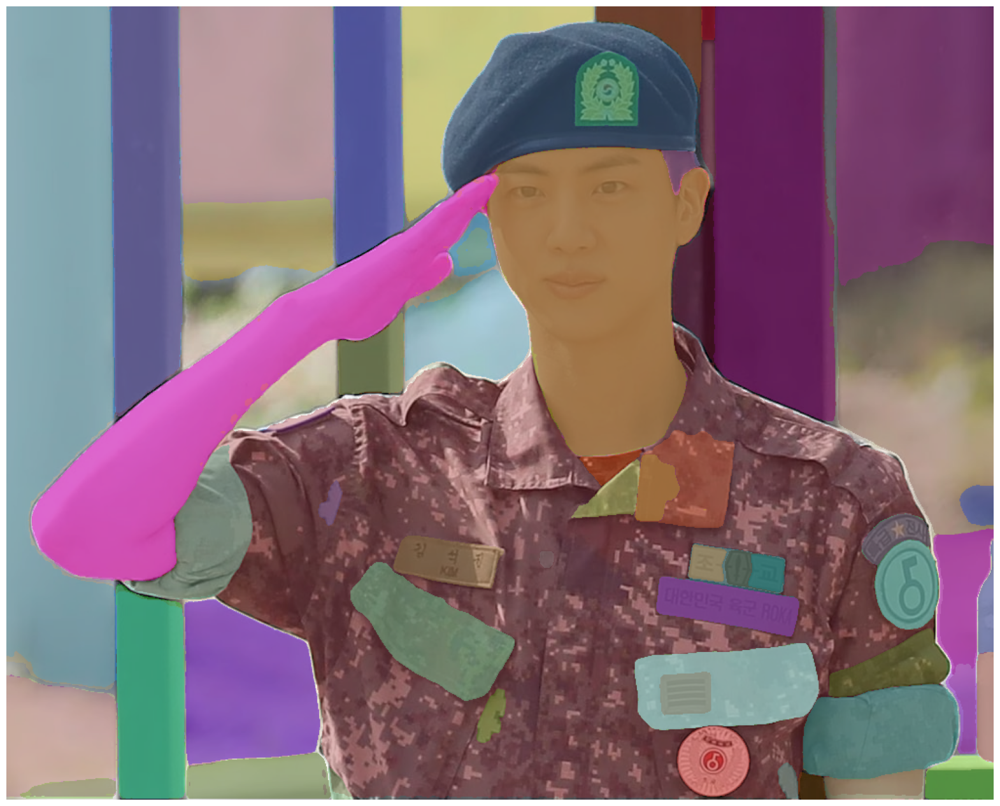

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.savefig('local.png')
plt.axis('off')
plt.show()


<Figure size 640x480 with 0 Axes>

In [15]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32, # 각 마스크에 한 번에  포함 될 점들의 수
    pred_iou_thresh=0.86,  # 최소 예측값 쓰레솔드 
    stability_score_thresh=0.92, #마스크 안정성
    crop_n_layers=1, # 모델의 레이어 수?
    crop_n_points_downscale_factor=2, # 마스크 생성 시 사용할 점 감소 비율
    min_mask_region_area=100, #최소 예측 면적 이 보다 작으면 무시할 수 있음
)

In [17]:
mask2 = mask_generator_2.generate(image)

In [18]:
len(mask2)

76

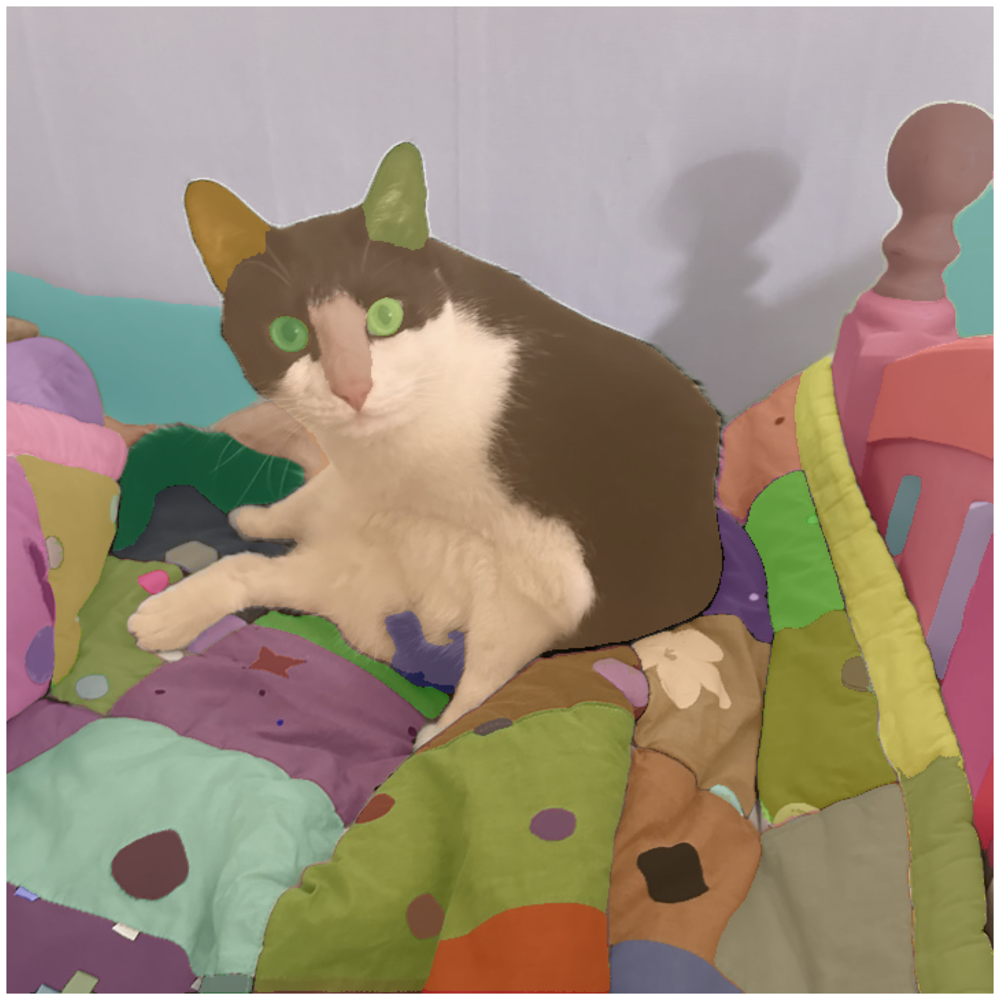

In [20]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(mask2)
plt.axis('off')
plt.show()

### 2. Select Segment

In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import io
from PIL import Image
# from google.colab import files

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=100):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='o', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='o', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    

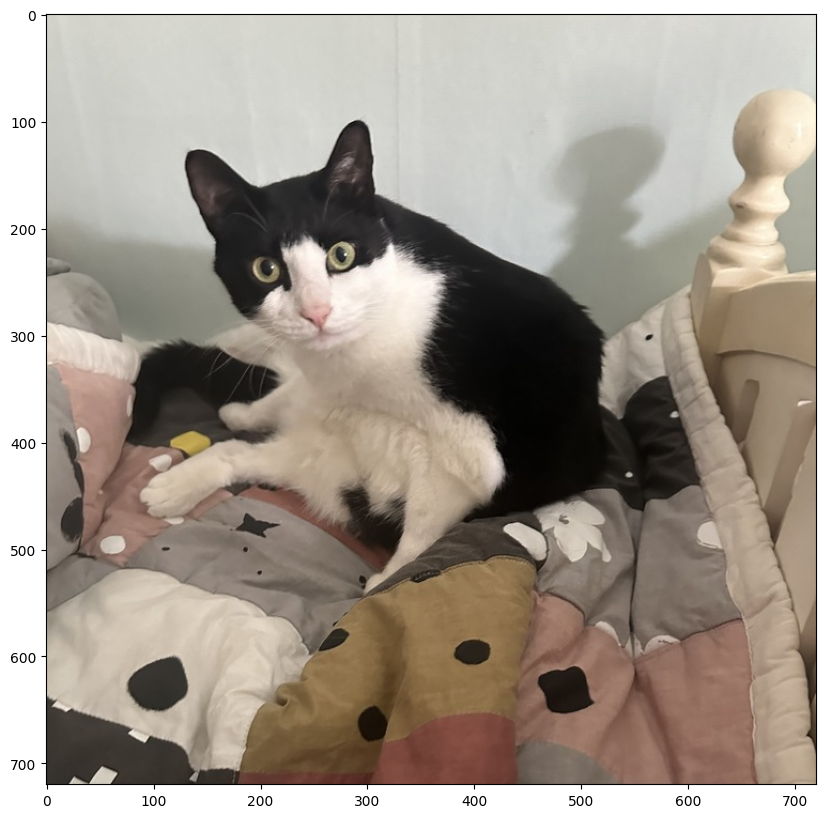

In [97]:
# 다운받은 샘플 이미지를 사용하는 경우
image = cv2.imread('images/cat.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [98]:
# import sys
# sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

In [99]:
predictor.set_image(image)

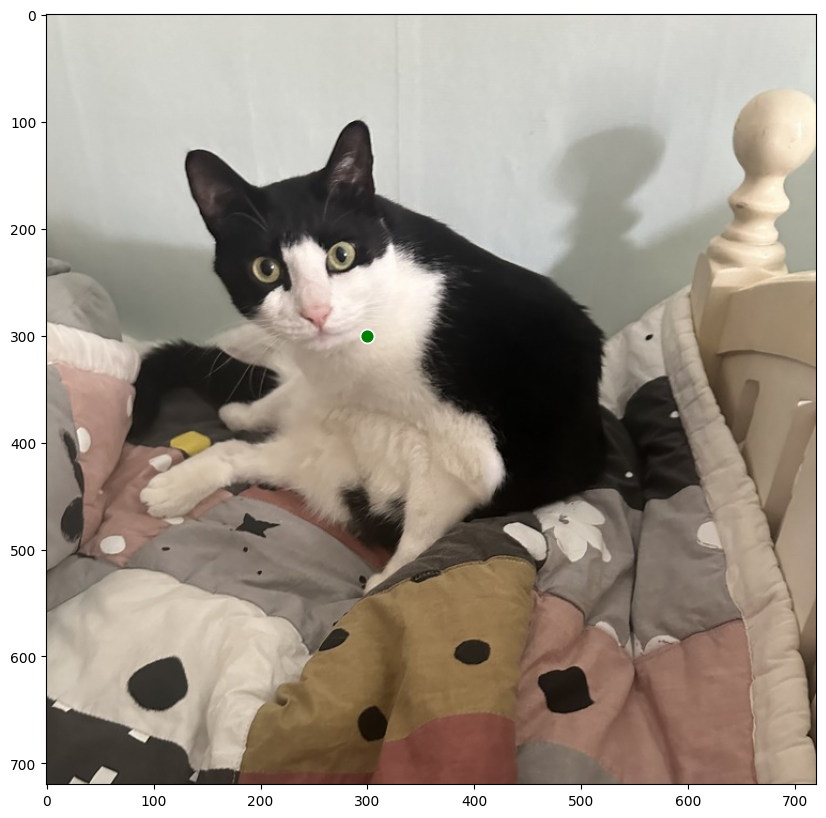

In [100]:
# input_point = np.array([[455, 600]]) # 길 좌표
input_point = np.array([[300, 300]])
input_label = np.array([1])

plt.figure(figsize=(10,10))
plt.imshow(image)
# 축반환 plt.gca()
show_points(input_point, input_label,  plt.gca())
plt.axis('on')
plt.show()

In [101]:
masks, scores, logits = predictor.predict(
    point_coords = input_point,
    point_labels = input_label,
    multimask_output=True
)

In [102]:
scores

array([0.9422042 , 0.99647033, 0.7747097 ], dtype=float32)

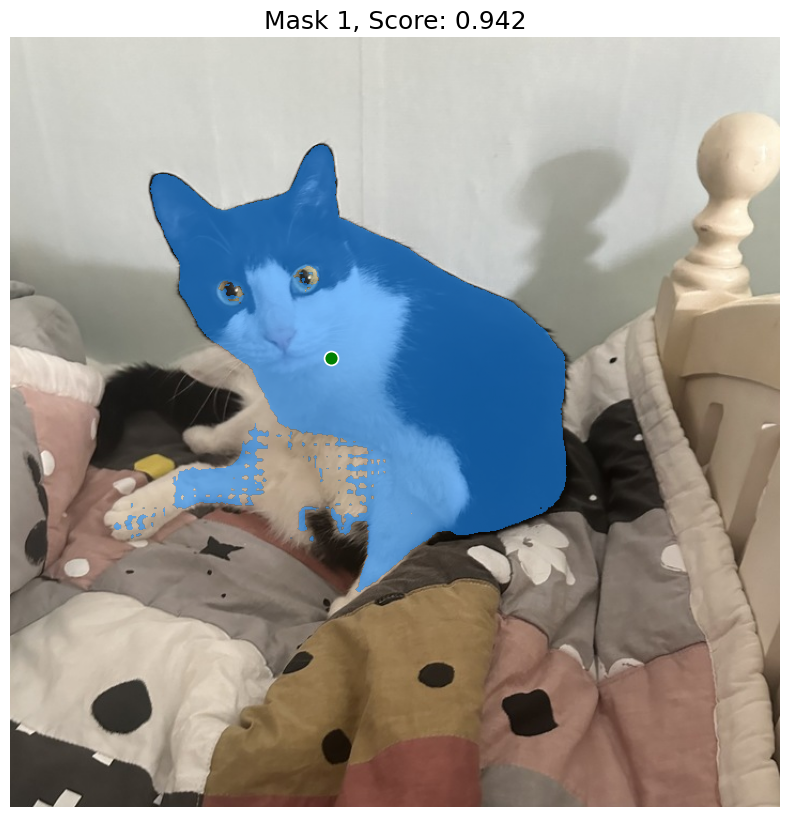

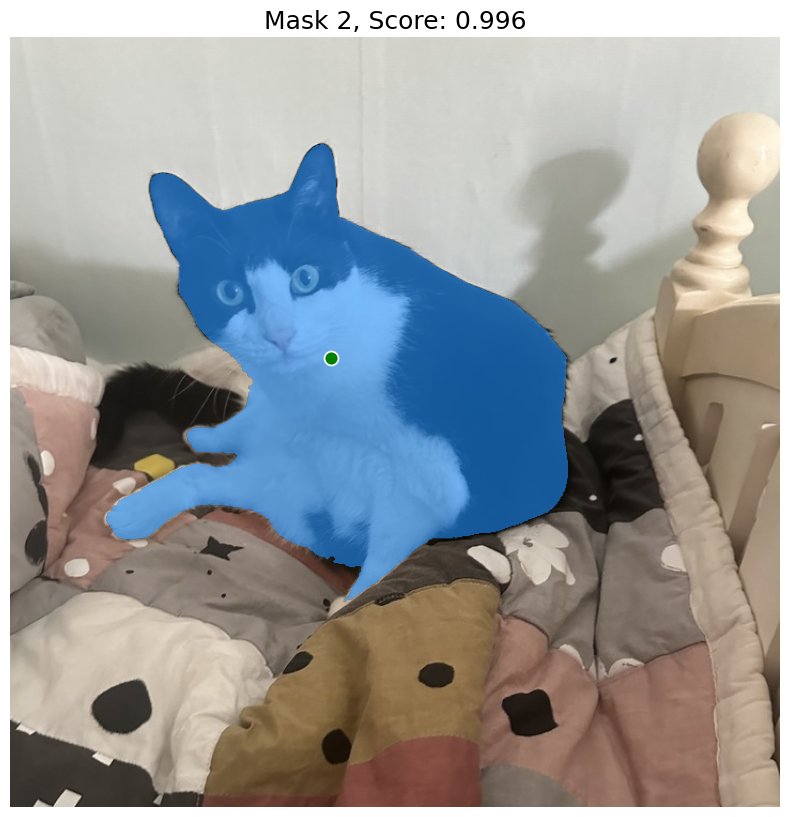

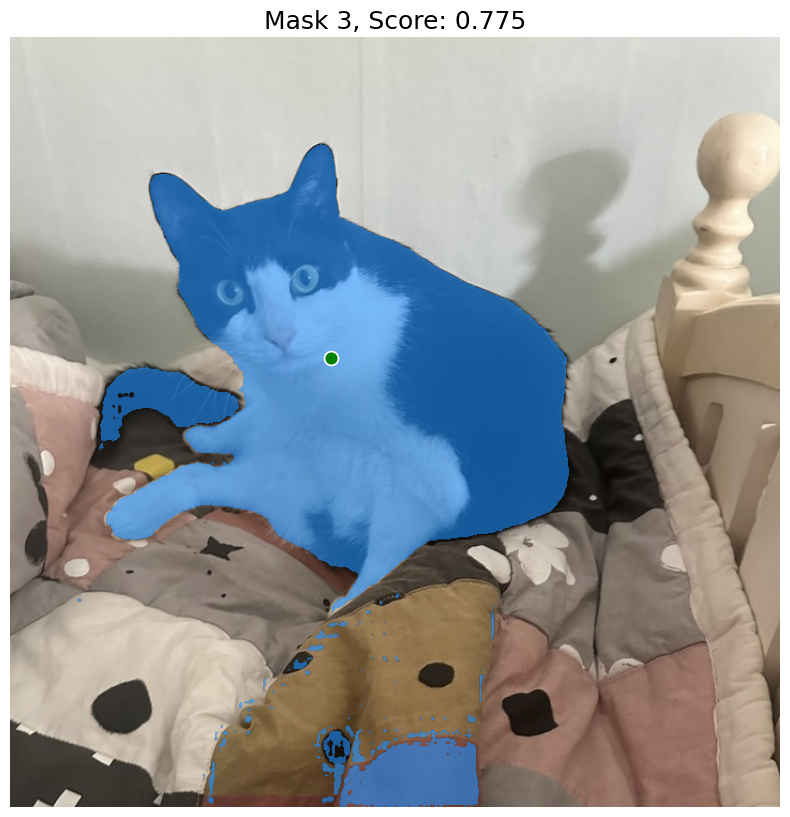

In [103]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f'Mask {i+1}, Score: {score:.3f}', fontsize=18)
    plt.axis('off')
    plt.show()

In [49]:
input_point = np.array([[205, 240], [300,400],[270, 220]])
input_label = np.array([1,0,1])

mask_input = logits[np.argmax(scores), : ,:]

In [50]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False
)

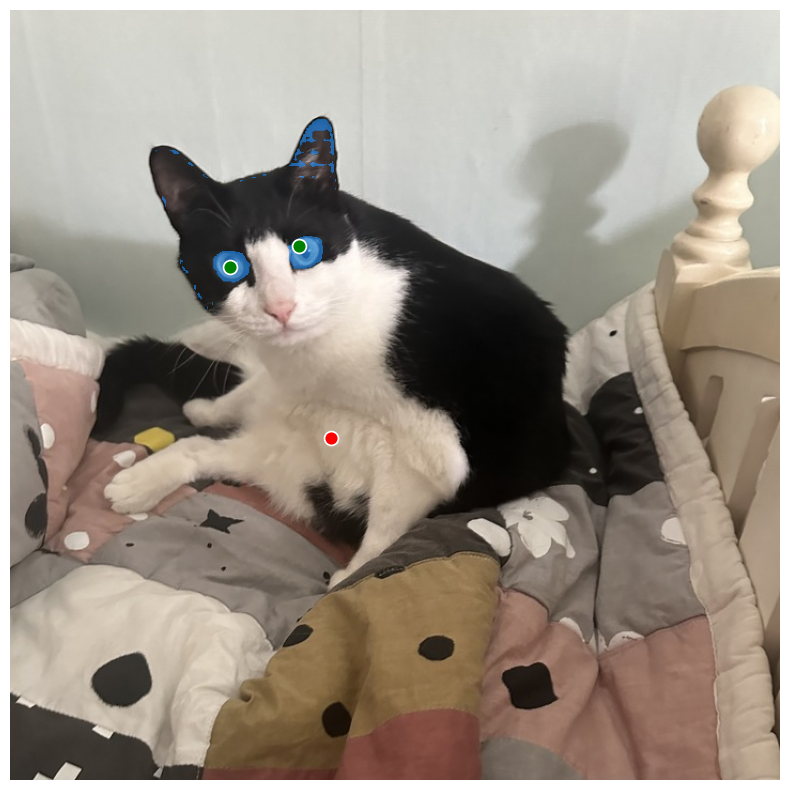

In [51]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

In [33]:
input_point = np.array([[100, 500], [600,100], [600,400], [600, 700]])
input_label = np.array([0, 1, 0, 1])

mask_input = logits[np.argmax(scores), : ,:]

In [34]:
masks, _, _ =predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False
)

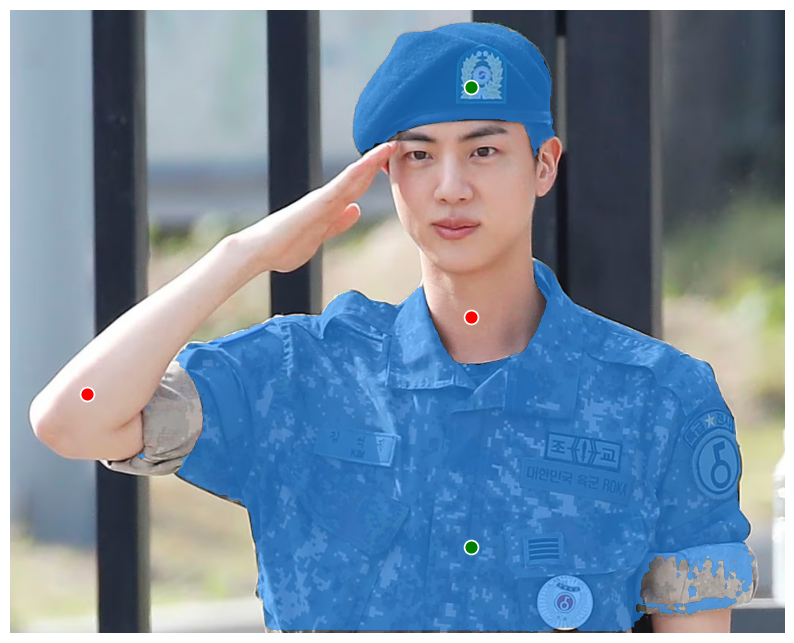

In [50]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

## 박스 분할

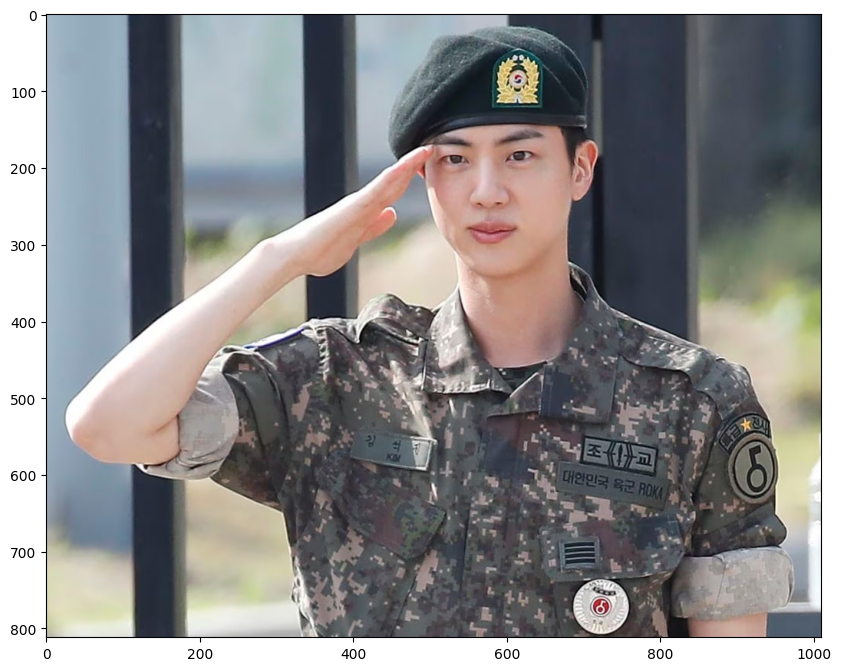

In [57]:
image = cv2.imread('images/person.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [78]:
# input_box = np.array([80, 100, 520, 500])
input_point = np.array([[600, 30], [600, 60]])
input_label = np.array([1,0])

In [79]:
input_box = np.array([420, 10, 720, 420])

In [80]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False
)

In [81]:
# 예측하기 전에 박스와 포인트 좌표 출력
print(f"Input box: {input_box}")
print(f"Input point: {input_point}, Input label: {input_label}")


Input box: [420  10 720 420]
Input point: [[600  30]
 [600  60]], Input label: [1 0]


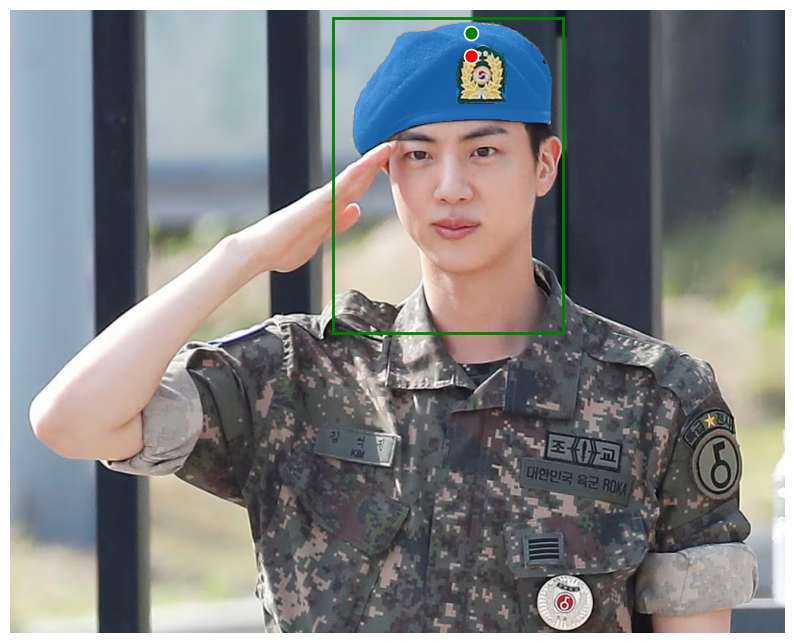

In [82]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

## 다중 입력

In [94]:

input_boxes = torch.tensor([
    [25, 15, 975, 800], # 전신
    [420, 10, 720, 180], #모자
    [590, 50, 680, 120], # 전역 마크
    [200, 375, 900, 800] # 옷,
], device=predictor.device)

In [95]:
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])
masks, _, _ = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

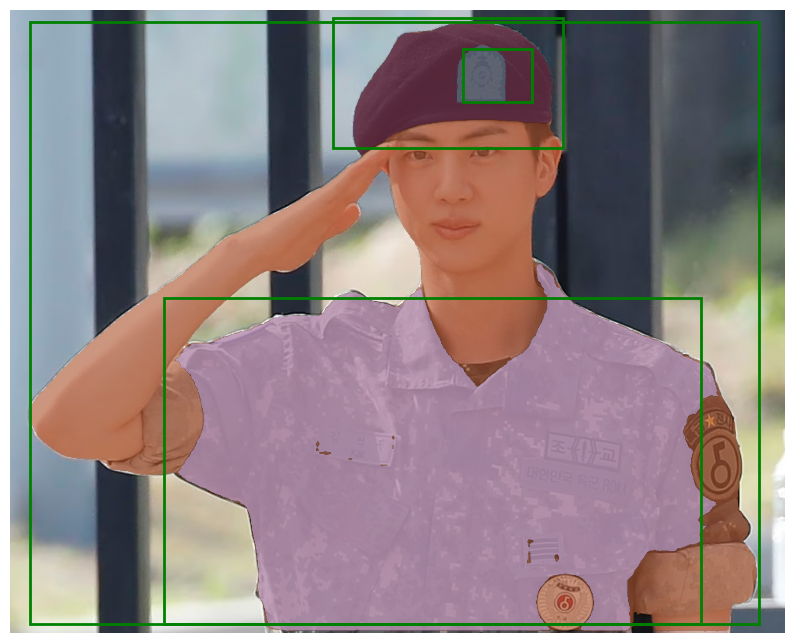

In [96]:
plt.figure(figsize=(10,10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box.cpu().numpy(), plt.gca())
plt.axis('off')
plt.show()